Import Necessary Functions

In [0]:
from pyspark.sql.functions import col, count, upper, concat, lit, when, split, size, concat_ws
from pyspark.sql import functions as F

Load and Clean Data

In [0]:
teams = spark.read.csv("dbfs:/mnt/cinqai_outputs/jn_adhoc/lead_scoring/data/nba_data/team_data/21.22_teamdata.csv", header=True, inferSchema=True)

teams = teams.withColumn("TEAM_ABBRV", upper(teams["TEAM_ABBRV"]))

teams_abbrv = teams.select("TEAM", "TEAM_ABBRV")

teams_join = teams.select("TEAM_ABBRV", "oPPG", "dEFF")

teams_join = teams_join.withColumnRenamed("TEAM_ABBRV", "TEAM_DEF")

In [0]:
players_original = spark.read.csv("dbfs:/mnt/cinqai_outputs/jn_adhoc/lead_scoring/data/nba_data/player_data/21.22_playerdata.csv", header=True, inferSchema=True)

players = players_original.withColumn("Team", upper(players_original["TEAM"]))

players = players.dropna()

players_filtered = players.filter(players["GP"] >= 50)

players_new = players.withColumn("GP_Filter", when(players.GP >= 50, "Yes").otherwise("No"))

players_norm = players_new.withColumn("ppg_norm", col("ppg") / col("MPG"))

players_norm = players_norm.withColumn("key", concat(col("FULL NAME"), lit("_"), col("Team")))

players_join = players_norm.select("FULL NAME", "TEAM", "POS", "GP", "MPG", "PPG", "TS%", "eFG%", "2P%", "3P%", "ORTG", "GP_Filter", "key")

In [0]:
shots = spark.read.csv("dbfs:/mnt/cinqai_outputs/jn_adhoc/lead_scoring/data/nba_data/game_data/21.22_shotsdata.csv", header=True, inferSchema=True)

# Split the column by space
split_col = split(col("TEAM_NAME"), " ")

# Determine where to split based on word count
shots_split = shots.withColumn(
    "TEAM_NEW",
    when(size(split_col) == 3, concat_ws(" ", split_col[0], split_col[1]))  # First two words if three exist
    .otherwise(split_col[0])  # First word otherwise
).withColumn(
    "TEAM_NEW2",
    when(size(split_col) == 3, split_col[2])  # Last word if three exist
    .otherwise(split_col[1])  # Second word otherwise
)

shots_renamed = shots_split.withColumn(
    "TEAM",
    when((col("TEAM_NEW") == "Los Angeles") & (col("TEAM_NEW2") == "Lakers"), "LA Lakers")
    .when((col("TEAM_NEW") == "Los Angeles") & (col("TEAM_NEW2") == "Clippers"), "LA Clippers")
    .when((col("TEAM_NEW") == "Portland Trail") & (col("TEAM_NEW2") == "Blazers"), "Portland")
    .otherwise(col("TEAM_NEW"))
)

shots_renamed = shots_renamed.withColumn(
    "AWAY_TEAM",
    when(col("AWAY_TEAM") == "BKN", "BRO").otherwise(col("AWAY_TEAM"))
)
shots_with_abbrv = shots_renamed.join(teams_abbrv, on="TEAM", how="left")

shot_defend = shots_with_abbrv.withColumn(
    "TEAM_DEF",
    when(col("TEAM_ABBRV") == col("HOME_TEAM"), col("AWAY_TEAM")).otherwise(col("HOME_TEAM"))
)

shot_cat = shot_defend.withColumn("SHOT_CAT", when(col("SHOT_MADE") == "true", 1).otherwise(0))

shots_final = shot_cat.withColumn("key", concat(col("PLAYER_NAME"), lit("_"), col("TEAM_ABBRV")))

In [0]:
# display(shots_final)

In [0]:
master_df1 = shots_final.join(players_join, on="key", how="left")
final_master = master_df1.join(teams_join, on="TEAM_DEF", how="left")

In [0]:
final_master_filter = final_master.filter(final_master.GP_Filter == "Yes")

In [0]:
final_master.count()

216722

In [0]:
final_master_filter.count()

161557

In [0]:
display(final_master)

TEAM_DEF,key,TEAM,SEASON_1,SEASON_2,TEAM_ID,TEAM_NAME,PLAYER_ID,PLAYER_NAME,POSITION_GROUP,POSITION,GAME_DATE,GAME_ID,HOME_TEAM,AWAY_TEAM,EVENT_TYPE,SHOT_MADE,ACTION_TYPE,SHOT_TYPE,BASIC_ZONE,ZONE_NAME,ZONE_ABB,ZONE_RANGE,LOC_X,LOC_Y,SHOT_DISTANCE,QUARTER,MINS_LEFT,SECS_LEFT,TEAM_NEW,TEAM_NEW2,TEAM_ABBRV,SHOT_CAT,FULL NAME,TEAM,POS,GP,MPG,PPG,TS%,eFG%,2P%,3P%,ORTG,GP_Filter,oPPG,dEFF
BRO,Pat Connaughton_MIL,Milwaukee,2022,2021-22,1610612749,Milwaukee Bucks,1626192,Pat Connaughton,F,SF,2021-10-19,22100001,MIL,BRO,Missed Shot,false,Jump Shot,3PT Field Goal,Left Corner 3,Left Side,L,24+ ft.,-2.4,6.125,24,1,0,0,Milwaukee,Bucks,MIL,0,Pat Connaughton,MIL,G,65,26.0,9.9,0.62,0.605,0.643,0.395,124.7,Yes,112.1,112.9
MIL,James Harden_BRO,Brooklyn,2022,2021-22,1610612751,Brooklyn Nets,201935,James Harden,G,PG,2021-10-19,22100001,MIL,BRO,Made Shot,true,Driving Floating Jump Shot,2PT Field Goal,Restricted Area,Center,C,Less Than 8 ft.,0.09,6.055,2,1,0,10,Brooklyn,Nets,BRO,1,James Harden,BRO,G,44,37.0,22.5,0.576,0.486,0.476,0.332,112.0,No,112.1,111.8
BRO,Jordan Nwora_MIL,Milwaukee,2022,2021-22,1610612749,Milwaukee Bucks,1629670,Jordan Nwora,F,SF,2021-10-19,22100001,MIL,BRO,Made Shot,true,Layup Shot,2PT Field Goal,Restricted Area,Center,C,Less Than 8 ft.,0.02,5.915,1,1,0,30,Milwaukee,Bucks,MIL,1,Jordan Nwora,MIL,F,62,19.1,7.9,0.506,0.488,0.455,0.348,99.6,Yes,112.1,112.9
BRO,Pat Connaughton_MIL,Milwaukee,2022,2021-22,1610612749,Milwaukee Bucks,1626192,Pat Connaughton,F,SF,2021-10-19,22100001,MIL,BRO,Missed Shot,false,Jump Shot,3PT Field Goal,Right Corner 3,Right Side,R,24+ ft.,2.43,6.495,25,1,0,32,Milwaukee,Bucks,MIL,0,Pat Connaughton,MIL,G,65,26.0,9.9,0.62,0.605,0.643,0.395,124.7,Yes,112.1,112.9
BRO,Brook Lopez_MIL,Milwaukee,2022,2021-22,1610612749,Milwaukee Bucks,201572,Brook Lopez,C,C,2021-10-19,22100001,MIL,BRO,Missed Shot,false,Turnaround Jump Shot,2PT Field Goal,Mid-Range,Center,C,16-24 ft.,0.07,7.455,16,1,0,38,Milwaukee,Bucks,MIL,0,Brook Lopez,MIL,C,13,23.0,12.4,0.57,0.538,0.538,0.358,112.9,No,112.1,112.9
MIL,Patty Mills_BRO,Brooklyn,2022,2021-22,1610612751,Brooklyn Nets,201988,Patty Mills,G,SG,2021-10-19,22100001,MIL,BRO,Made Shot,true,Running Jump Shot,3PT Field Goal,Above the Break 3,Right Side Center,RC,24+ ft.,1.52,7.935,26,1,0,52,Brooklyn,Nets,BRO,1,Patty Mills,BRO,G,81,29.0,11.4,0.562,0.55,0.427,0.4,111.8,Yes,112.1,111.8
BRO,George Hill_MIL,Milwaukee,2022,2021-22,1610612749,Milwaukee Bucks,201588,George Hill,G,PG,2021-10-19,22100001,MIL,BRO,Missed Shot,false,Jump Shot,3PT Field Goal,Above the Break 3,Center,C,24+ ft.,0.61,8.605,28,1,1,1,Milwaukee,Bucks,MIL,0,George Hill,MIL,G,54,23.2,6.2,0.552,0.504,0.546,0.306,117.7,Yes,112.1,112.9
BRO,Jordan Nwora_MIL,Milwaukee,2022,2021-22,1610612749,Milwaukee Bucks,1629670,Jordan Nwora,F,SF,2021-10-19,22100001,MIL,BRO,Missed Shot,false,Pullup Jump shot,2PT Field Goal,Mid-Range,Right Side,R,8-16 ft.,1.42,6.505,15,1,1,38,Milwaukee,Bucks,MIL,0,Jordan Nwora,MIL,F,62,19.1,7.9,0.506,0.488,0.455,0.348,99.6,Yes,112.1,112.9
MIL,LaMarcus Aldridge_BRO,Brooklyn,2022,2021-22,1610612751,Brooklyn Nets,200746,LaMarcus Aldridge,C,C,2021-10-19,22100001,MIL,BRO,Missed Shot,false,Jump Shot,2PT Field Goal,In The Paint (Non-RA),Center,C,8-16 ft.,-0.23,7.085,13,1,1,51,Brooklyn,Nets,BRO,0,LaMarcus Aldridge,BRO,C-F,47,22.3,12.9,0.604,0.566,0.578,0.304,119.6,No,112.1,111.8
BRO,Thanasis Antetokounmpo_MIL,Milwaukee,2022,2021-22,1610612749,Milwaukee Bucks,203648,Thanasis Antetokounmpo,F,SF,2021-10-19,22100001,MIL,BRO,Made Shot,true,Driving Hook Shot,2PT Field Goal,Restricted Area,Center,C,Less Than 8 ft.,-0.05,6.115,3,1,2,0,Milwaukee,Bucks,MIL,1,Thanasis Antetokounmpo,MIL,F,48,9.9,3.6,0.577,0.555,0.596,0.143,113.4,No,112.1,112.9


In [0]:
# display(teams)

EDA

In [0]:
print(f"There are {players.count()} players that played in the 2021-22 season. Of those, {players_filtered.count()} played 50+ games that season.")

There are 661 players that played in the 2021-22 season. Of those, 260 played 50+ games that season.


EDA - Shots

In [0]:
action_types = shots.groupBy("action_type") \
  .agg(count("*").alias("count")) \
  .orderBy(col("count").desc()) \
  .show(truncate=False)

+-------------------------------+-----+
|action_type                    |count|
+-------------------------------+-----+
|Jump Shot                      |70930|
|Pullup Jump shot               |26249|
|Driving Layup Shot             |18944|
|Step Back Jump shot            |10310|
|Driving Floating Jump Shot     |9586 |
|Layup Shot                     |7977 |
|Cutting Layup Shot             |5282 |
|Running Layup Shot             |5152 |
|Driving Finger Roll Layup Shot |5048 |
|Floating Jump shot             |4836 |
|Tip Layup Shot                 |4459 |
|Fadeaway Jump Shot             |4031 |
|Putback Layup Shot             |3314 |
|Cutting Dunk Shot              |3121 |
|Turnaround Jump Shot           |3080 |
|Turnaround Fadeaway shot       |2976 |
|Running Jump Shot              |2944 |
|Driving Floating Bank Jump Shot|2596 |
|Turnaround Hook Shot           |2330 |
|Running Dunk Shot              |2192 |
+-------------------------------+-----+
only showing top 20 rows



In [0]:
zones_ = shots.groupBy("ZONE_NAME") \
  .agg(count("*").alias("count")) \
  .orderBy(col("count").desc()) \
  .show(truncate=False)

+-----------------+------+
|ZONE_NAME        |count |
+-----------------+------+
|Center           |120736|
|Left Side Center |28896 |
|Right Side Center|27163 |
|Left Side        |20268 |
|Right Side       |19184 |
|Back Court       |475   |
+-----------------+------+



In [0]:
basic_zones = shots.groupBy("BASIC_ZONE") \
  .agg(count("*").alias("count")) \
  .orderBy(col("count").desc()) \
  .show(truncate=False)

+---------------------+-----+
|BASIC_ZONE           |count|
+---------------------+-----+
|Above the Break 3    |64447|
|Restricted Area      |62987|
|In The Paint (Non-RA)|39668|
|Mid-Range            |27712|
|Left Corner 3        |11377|
|Right Corner 3       |10091|
|Backcourt            |440  |
+---------------------+-----+



In [0]:
shot_range = shots.groupBy("ZONE_RANGE") \
  .agg(count("*").alias("count")) \
  .orderBy(col("count").desc()) \
  .show(truncate=False)

+---------------+-----+
|ZONE_RANGE     |count|
+---------------+-----+
|Less Than 8 ft.|86338|
|24+ ft.        |85880|
|8-16 ft.       |28560|
|16-24 ft.      |15469|
|Back Court Shot|475  |
+---------------+-----+



In [0]:
shots_per_quarter = shots.groupBy("QUARTER") \
  .agg(count("*").alias("count")) \
  .orderBy(col("count").desc()) \
  .show(truncate=False)

+-------+-----+
|QUARTER|count|
+-------+-----+
|1      |56132|
|2      |54489|
|3      |53475|
|4      |51488|
|5      |985  |
|6      |123  |
|7      |30   |
+-------+-----+



EDA - Teams

In [0]:
top_10_shot_teams = shots.groupBy("TEAM_NAME") \
  .agg(count("*").alias("count")) \
  .orderBy(col("count").desc()) \
  .show(10, truncate=False)

+----------------------+-----+
|TEAM_NAME             |count|
+----------------------+-----+
|Memphis Grizzlies     |7739 |
|San Antonio Spurs     |7601 |
|Charlotte Hornets     |7497 |
|Toronto Raptors       |7489 |
|Minnesota Timberwolves|7458 |
|Phoenix Suns          |7389 |
|Indiana Pacers        |7338 |
|Milwaukee Bucks       |7331 |
|Oklahoma City Thunder |7310 |
|Los Angeles Lakers    |7279 |
+----------------------+-----+
only showing top 10 rows



In [0]:
bottom_10_shot_teams = shots.groupBy("TEAM_NAME") \
  .agg(count("*").alias("count")) \
  .orderBy(col("count").asc()) \
  .show(10, truncate=False)

+---------------------+-----+
|TEAM_NAME            |count|
+---------------------+-----+
|Philadelphia 76ers   |6932 |
|Cleveland Cavaliers  |6940 |
|Miami Heat           |6954 |
|Dallas Mavericks     |6982 |
|Washington Wizards   |7056 |
|Utah Jazz            |7067 |
|New York Knicks      |7069 |
|Denver Nuggets       |7079 |
|Houston Rockets      |7083 |
|Golden State Warriors|7087 |
+---------------------+-----+
only showing top 10 rows



In [0]:
oPPg = teams.select("TEAM", "oPPG")
top10_oPPg = oPPg.orderBy(col("oPPG").asc()).limit(10)
display(top10_oPPg)

TEAM,oPPG
Boston,104.5
Dallas,104.7
Golden State,105.5
Miami,105.6
Cleveland,105.7
New York,106.6
Toronto,107.1
Philadelphia,107.3
Phoenix,107.3
Utah,107.6


In [0]:
dEFF = teams.select("TEAM", "dEFF")
top10_dEFF = dEFF.orderBy(col("dEFF").asc()).limit(10)
display(top10_dEFF)

TEAM,dEFF
Golden State,107.0
Boston,107.0
Phoenix,107.4
Memphis,109.0
Miami,109.1
Dallas,109.4
Cleveland,109.7
LA Clippers,110.2
Utah,110.5
Toronto,110.6


In [0]:
bottom10_oPPg = oPPg.orderBy(col("oPPG").desc()).limit(10)
display(bottom10_oPPg)

TEAM,oPPG
Houston,118.2
Sacramento,115.8
Portland,115.1
LA Lakers,115.1
Indiana,114.9
Charlotte,114.9
Minnesota,113.3
San Antonio,113.0
Detroit,112.5
Atlanta,112.4


In [0]:
bottom10_dEFF = dEFF.orderBy(col("dEFF").desc()).limit(10)
display(bottom10_dEFF)

TEAM,dEFF
Portland,116.9
Houston,116.8
Indiana,116.1
Sacramento,115.4
Atlanta,114.9
Washington,114.6
Detroit,113.8
Charlotte,113.8
Chicago,113.6
LA Lakers,113.5


EDA - Players

In [0]:
top_10_shot_takers = final_master_filter.groupBy("player_name") \
  .agg(count("*").alias("count")) \
  .orderBy(col("count").desc()) \
  .show(10, truncate=False)

+----------------+-----+
|player_name     |count|
+----------------+-----+
|Jayson Tatum    |1564 |
|Trae Young      |1544 |
|DeMar DeRozan   |1535 |
|Devin Booker    |1421 |
|Luka Doncic     |1403 |
|Donovan Mitchell|1376 |
|Joel Embiid     |1334 |
|Nikola Jokic    |1311 |
|LaMelo Ball     |1254 |
|Julius Randle   |1246 |
+----------------+-----+
only showing top 10 rows



In [0]:
eFG = players_filtered.select("FULL NAME", "eFG%")
top10_eFG = eFG.orderBy(col("eFG%").desc()).limit(10)
display(top10_eFG)

FULL NAME,eFG%
Mitchell Robinson,0.761
Robert Williams III,0.736
Rudy Gobert,0.713
Daniel Gafford,0.695
Dwight Powell,0.687
Gary Payton II,0.679
Jarrett Allen,0.678
Damian Jones,0.677
Nick Richards,0.667
Hassan Whiteside,0.652


In [0]:
TS = players_filtered.select("FULL NAME", "TS%")
top10_TS = TS.orderBy(col("TS%").desc()).limit(10)
display(top10_TS)

FULL NAME,TS%
Robert Williams III,0.745
Rudy Gobert,0.732
Dwight Powell,0.725
Mitchell Robinson,0.722
Daniel Gafford,0.709
Damian Jones,0.701
Jarrett Allen,0.698
Nick Richards,0.689
Jaxson Hayes,0.679
Gary Payton II,0.679


In [0]:
two_pt = players_filtered.select("FULL NAME", "2P%")
top10_two_pt = two_pt.orderBy(col("2P%").desc()).limit(10)
display(top10_two_pt)

FULL NAME,2P%
Mitchell Robinson,0.761
Gary Payton II,0.754
Robert Williams III,0.738
Rudy Gobert,0.718
Dwight Powell,0.703
Daniel Gafford,0.697
Damian Jones,0.696
Jarrett Allen,0.688
Matisse Thybulle,0.673
Moritz Wagner,0.672


In [0]:
three_pt = players_filtered.select("FULL NAME", "3P%")
top10_three_pt = three_pt.orderBy(col("3P%").desc()).limit(10)
display(top10_three_pt)

FULL NAME,3P%
Jakob Poeltl,1.0
Dwight Howard,0.533
Isaiah Hartenstein,0.467
Luke Kennard,0.449
Desmond Bane,0.436
Tyrese Maxey,0.427
Cameron Johnson,0.425
Doug McDermott,0.422
P.J. Tucker,0.415
Cory Joseph,0.414


In [0]:
ORTG = players_filtered.select("FULL NAME", "ORTG")
top10_ORTG = ORTG.orderBy(col("ORTG").desc()).limit(10)
display(top10_ORTG)

FULL NAME,ORTG
Robert Williams III,149.8
Dwight Powell,144.5
Mitchell Robinson,144.1
Rudy Gobert,138.5
Brandon Clarke,137.4
Daniel Gafford,136.2
Clint Capela,134.0
John Konchar,133.0
Hassan Whiteside,133.0
Jarrett Allen,132.8


In [0]:
display(final_master_filter)

TEAM_DEF,key,TEAM,SEASON_1,SEASON_2,TEAM_ID,TEAM_NAME,PLAYER_ID,PLAYER_NAME,POSITION_GROUP,POSITION,GAME_DATE,GAME_ID,HOME_TEAM,AWAY_TEAM,EVENT_TYPE,SHOT_MADE,ACTION_TYPE,SHOT_TYPE,BASIC_ZONE,ZONE_NAME,ZONE_ABB,ZONE_RANGE,LOC_X,LOC_Y,SHOT_DISTANCE,QUARTER,MINS_LEFT,SECS_LEFT,TEAM_NEW,TEAM_NEW2,TEAM_ABBRV,SHOT_CAT,FULL NAME,TEAM,POS,GP,MPG,PPG,TS%,eFG%,2P%,3P%,ORTG,GP_Filter,oPPG,dEFF
BRO,Pat Connaughton_MIL,Milwaukee,2022,2021-22,1610612749,Milwaukee Bucks,1626192,Pat Connaughton,F,SF,2021-10-19,22100001,MIL,BRO,Missed Shot,false,Jump Shot,3PT Field Goal,Left Corner 3,Left Side,L,24+ ft.,-2.4,6.125,24,1,0,0,Milwaukee,Bucks,MIL,0,Pat Connaughton,MIL,G,65,26.0,9.9,0.62,0.605,0.643,0.395,124.7,Yes,112.1,112.9
BRO,Jordan Nwora_MIL,Milwaukee,2022,2021-22,1610612749,Milwaukee Bucks,1629670,Jordan Nwora,F,SF,2021-10-19,22100001,MIL,BRO,Made Shot,true,Layup Shot,2PT Field Goal,Restricted Area,Center,C,Less Than 8 ft.,0.02,5.915,1,1,0,30,Milwaukee,Bucks,MIL,1,Jordan Nwora,MIL,F,62,19.1,7.9,0.506,0.488,0.455,0.348,99.6,Yes,112.1,112.9
BRO,Pat Connaughton_MIL,Milwaukee,2022,2021-22,1610612749,Milwaukee Bucks,1626192,Pat Connaughton,F,SF,2021-10-19,22100001,MIL,BRO,Missed Shot,false,Jump Shot,3PT Field Goal,Right Corner 3,Right Side,R,24+ ft.,2.43,6.495,25,1,0,32,Milwaukee,Bucks,MIL,0,Pat Connaughton,MIL,G,65,26.0,9.9,0.62,0.605,0.643,0.395,124.7,Yes,112.1,112.9
MIL,Patty Mills_BRO,Brooklyn,2022,2021-22,1610612751,Brooklyn Nets,201988,Patty Mills,G,SG,2021-10-19,22100001,MIL,BRO,Made Shot,true,Running Jump Shot,3PT Field Goal,Above the Break 3,Right Side Center,RC,24+ ft.,1.52,7.935,26,1,0,52,Brooklyn,Nets,BRO,1,Patty Mills,BRO,G,81,29.0,11.4,0.562,0.55,0.427,0.4,111.8,Yes,112.1,111.8
BRO,George Hill_MIL,Milwaukee,2022,2021-22,1610612749,Milwaukee Bucks,201588,George Hill,G,PG,2021-10-19,22100001,MIL,BRO,Missed Shot,false,Jump Shot,3PT Field Goal,Above the Break 3,Center,C,24+ ft.,0.61,8.605,28,1,1,1,Milwaukee,Bucks,MIL,0,George Hill,MIL,G,54,23.2,6.2,0.552,0.504,0.546,0.306,117.7,Yes,112.1,112.9
BRO,Jordan Nwora_MIL,Milwaukee,2022,2021-22,1610612749,Milwaukee Bucks,1629670,Jordan Nwora,F,SF,2021-10-19,22100001,MIL,BRO,Missed Shot,false,Pullup Jump shot,2PT Field Goal,Mid-Range,Right Side,R,8-16 ft.,1.42,6.505,15,1,1,38,Milwaukee,Bucks,MIL,0,Jordan Nwora,MIL,F,62,19.1,7.9,0.506,0.488,0.455,0.348,99.6,Yes,112.1,112.9
MIL,Patty Mills_BRO,Brooklyn,2022,2021-22,1610612751,Brooklyn Nets,201988,Patty Mills,G,SG,2021-10-19,22100001,MIL,BRO,Made Shot,true,Running Pull-Up Jump Shot,3PT Field Goal,Above the Break 3,Left Side Center,LC,24+ ft.,-1.24,8.155000000000001,26,1,2,18,Brooklyn,Nets,BRO,1,Patty Mills,BRO,G,81,29.0,11.4,0.562,0.55,0.427,0.4,111.8,Yes,112.1,111.8
BRO,Pat Connaughton_MIL,Milwaukee,2022,2021-22,1610612749,Milwaukee Bucks,1626192,Pat Connaughton,F,SF,2021-10-19,22100001,MIL,BRO,Made Shot,true,Cutting Dunk Shot,2PT Field Goal,Restricted Area,Center,C,Less Than 8 ft.,-0.04,5.995,2,1,2,53,Milwaukee,Bucks,MIL,1,Pat Connaughton,MIL,G,65,26.0,9.9,0.62,0.605,0.643,0.395,124.7,Yes,112.1,112.9
MIL,Patty Mills_BRO,Brooklyn,2022,2021-22,1610612751,Brooklyn Nets,201988,Patty Mills,G,SG,2021-10-19,22100001,MIL,BRO,Made Shot,true,Pullup Jump shot,3PT Field Goal,Above the Break 3,Left Side Center,LC,24+ ft.,-2.16,7.325,26,1,3,15,Brooklyn,Nets,BRO,1,Patty Mills,BRO,G,81,29.0,11.4,0.562,0.55,0.427,0.4,111.8,Yes,112.1,111.8
BRO,Jrue Holiday_MIL,Milwaukee,2022,2021-22,1610612749,Milwaukee Bucks,201950,Jrue Holiday,G,PG,2021-10-19,22100001,MIL,BRO,Made Shot,true,Pullup Jump shot,3PT Field Goal,Above the Break 3,Right Side Center,RC,24+ ft.,0.8800000000000001,8.305,26,1,3,22,Milwaukee,Bucks,MIL,1,Jrue Holiday,MIL,G,67,32.9,18.3,0.593,0.57,0.547,0.411,117.4,Yes,112.1,112.9


Correlations

In [0]:
numerical_cols = ['GP', 'MPG', 'PPG', 'TS%', 'eFG%', '2P%', '3P%', 'ORTG', 'oPPG', 'dEFF']

for col in numerical_cols:
    correlation = final_master_filter.stat.corr("SHOT_CAT", col)
    print(f"Correlation between binary_target and {col}: {correlation}")

Correlation between binary_target and GP: 0.004504726555428531
Correlation between binary_target and MPG: 0.0038904644914066816
Correlation between binary_target and PPG: 0.012469068120573657
Correlation between binary_target and TS%: 0.10006585888179964
Correlation between binary_target and eFG%: 0.1014264830366379
Correlation between binary_target and 2P%: 0.10155613503737715
Correlation between binary_target and 3P%: -0.03608595115539505
Correlation between binary_target and ORTG: 0.09365930175209722
Correlation between binary_target and oPPG: 0.0005129161040966958
Correlation between binary_target and dEFF: 0.00014456490563984854


In [0]:
# categorical_cols=["TEAM_ABBRV", "TEAM_DEF", "POSITION", "POSITION_GROUP", "EVENT_TYPE", "ACTION_TYPE", "SHOT_TYPE", "BASIC_ZONE",
                                        #    "ZONE_NAME", "ZONE_RANGE", "SHOT_DISTANCE", "QUARTER", "POS", "SHOT_CAT"]

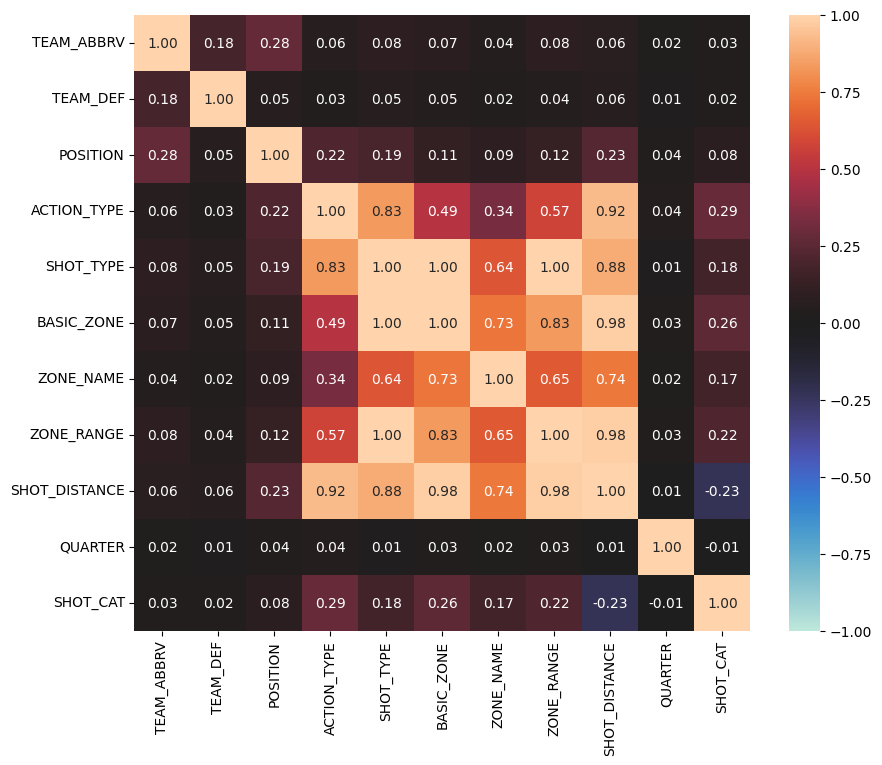

In [0]:
from dython.nominal import associations

master_pandas = final_master_filter.select("TEAM_ABBRV", "TEAM_DEF", "POSITION", "ACTION_TYPE", "SHOT_TYPE", "BASIC_ZONE",
                                           "ZONE_NAME", "ZONE_RANGE", "SHOT_DISTANCE", "QUARTER", "SHOT_CAT").toPandas()

corr_matrix = associations(master_pandas,  figsize=(10, 8))

In [0]:
corrs = corr_matrix['corr'].round(2)
shot_corrs = corrs["SHOT_CAT"]
high_shot_corrs = shot_corrs[shot_corrs > 0.07]
print(high_shot_corrs)

POSITION       0.08
ACTION_TYPE    0.29
SHOT_TYPE      0.18
BASIC_ZONE     0.26
ZONE_NAME      0.17
ZONE_RANGE     0.22
SHOT_CAT       1.00
Name: SHOT_CAT, dtype: float64


Model Building

In [0]:
master_model = final_master_filter.select("FULL NAME", "TEAM_ABBRV", "POSITION", "ACTION_TYPE", "SHOT_TYPE", "BASIC_ZONE", "ZONE_NAME", "ZONE_RANGE", "TS%", "eFG%", "2P%", "ORTG", "SHOT_CAT")

In [0]:
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler
from pyspark.ml.classification import LogisticRegression
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator
from pyspark.mllib.evaluation import MulticlassMetrics

In [0]:
categorical_cols = ["POSITION", "ACTION_TYPE", "SHOT_TYPE", "BASIC_ZONE", "ZONE_NAME", "ZONE_RANGE"]
numerical_cols = ["TS%", "eFG%", "2P%", "ORTG"]

# Indexing and One-Hot Encoding for categorical variables
indexers = [StringIndexer(inputCol=col, outputCol=col+"_indexed") for col in categorical_cols]
encoders = [OneHotEncoder(inputCol=col+"_indexed", outputCol=col+"_encoded") for col in categorical_cols]

# Assembling features
assembler = VectorAssembler(
    inputCols=numerical_cols + [col+"_encoded" for col in categorical_cols],
    outputCol="features"
)

In [0]:
train_data, test_data = master_model.randomSplit([0.7, 0.3], seed=42)

In [0]:
lr = LogisticRegression(featuresCol="features", labelCol="SHOT_CAT")

pipeline = Pipeline(stages=indexers + encoders + [assembler, lr])

model = pipeline.fit(train_data)

In [0]:
predictions = model.transform(test_data)

# predictions.select("SHOT_CAT", "probability", "prediction").show()

In [0]:
# Accuracy Evaluator
accuracy_evaluator = MulticlassClassificationEvaluator(
    labelCol="SHOT_CAT", predictionCol="prediction", metricName="accuracy"
)

# Calculate accuracy
accuracy = accuracy_evaluator.evaluate(predictions)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.63


In [0]:
prediction_and_labels = predictions.select("prediction", "SHOT_CAT").rdd.map(lambda x: (float(x[0]), float(x[1])))

# Compute confusion matrix
metrics = MulticlassMetrics(prediction_and_labels)
confusion_matrix = metrics.confusionMatrix().toArray()

# Display confusion matrix
print("Confusion Matrix:")
print(confusion_matrix)

/databricks/spark/python/pyspark/sql/context.py:165: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


Confusion Matrix:
[[21338.  4548.]
 [13298.  9042.]]


In [0]:
auc_evaluator = BinaryClassificationEvaluator(
    labelCol="SHOT_CAT", rawPredictionCol="rawPrediction", metricName="areaUnderROC"
)

# Calculate AUC
auc = auc_evaluator.evaluate(predictions)
print(f"AUC: {auc:.2f}")

AUC: 0.66


In [0]:
# Extract the Logistic Regression model
lr_model = model.stages[-1]

# Get coefficients and intercept
coefficients = lr_model.coefficients
intercept = lr_model.intercept

# List of feature names
feature_names = numerical_cols + [f"{col}_encoded" for col in categorical_cols]

# Display Feature Importance
print(f"Intercept: {intercept}")
print("Feature Importance (Coefficients):")
for name, coef in zip(feature_names, coefficients):
    print(f"{name}: {coef}")

Intercept: -4.331175456673543
Feature Importance (Coefficients):
TS%: 2.589178022464932
eFG%: 1.004325438648482
2P%: -0.6274112709711326
ORTG: -0.003500144629053298
POSITION_encoded: -0.05563114804021202
ACTION_TYPE_encoded: -0.015340553305949012
SHOT_TYPE_encoded: -0.07326420444846148
BASIC_ZONE_encoded: -0.09528434151984719
ZONE_NAME_encoded: -0.09441451201204046
ZONE_RANGE_encoded: -0.6369005840208134


In [0]:
from pyspark.sql.functions import col, count, sum, round

shots_made = master_model.groupBy("SHOT_CAT") \
  .agg(count("*").alias("count")) \
  .orderBy(col("count").desc())

# Compute total count of shots
total_shots = shots_made.agg(sum("count").alias("total")).collect()[0]["total"]

# Add percentage of total column
shots_made = shots_made.withColumn("percentage", round((col("count") / total_shots) * 100, 2))

# Show results
shots_made.show()

+--------+-----+----------+
|SHOT_CAT|count|percentage|
+--------+-----+----------+
|       0|86515|     53.55|
|       1|75042|     46.45|
+--------+-----+----------+

